importo librerias

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import ydata_profiling as ydp

cargo datasets

In [39]:
df = pd.read_csv(r'D:\projectos\programacion\henrry\bootcamp\proyecto final\Projecto_final_henry\DATASETS\daily_data_2000_2020.csv')


df.head(20)


,date,temperature_2m_max,temperature_2m_min,temperature_2m_mean,daylight_duration,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,wind_speed_10m_max,wind_gusts_10m_max,wind_direction_10m_dominant
0,2000-01-01 00:00:00+00:00,9.4835,-3.066500,1.221000,33502.613,0.0,0.0,0.00,0.0,12.245293,23.039999,218.862720
1,2000-01-02 00:00:00+00:00,14.3335,0.533500,5.710583,33545.810,0.0,0.0,0.00,0.0,13.979871,28.800000,213.906300
2,2000-01-03 00:00:00+00:00,15.5835,10.233500,11.543918,33593.145,1.1,1.1,0.00,5.0,18.079027,33.480000,219.183780
3,2000-01-04 00:00:00+00:00,15.6835,10.183500,12.729332,33644.492,7.3,7.3,0.00,7.0,24.269983,71.640000,187.888630
4,2000-01-05 00:00:00+00:00,13.9335,0.083500,4.562666,33699.742,12.1,12.1,0.00,8.0,24.951921,56.880000,306.187680
5,2000-01-06 00:00:00+00:00,4.8835,-4.766500,-0.774833,33758.770,0.0,0.0,0.00,0.0,13.755580,26.640000,120.560745
6,2000-01-07 00:00:00+00:00,7.7835,-2.016500,1.702250,33821.453,0.0,0.0,0.00,0.0,21.791153,40.320000,242.008060
7,2000-01-08 00:00:00+00:00,3.3335,-4.166500,-0.149833,33887.668,0.0,0.0,0.00,0.0,13.708391,33.839996,266.537660
8,2000-01-09 00:00:00+00:00,9.4835,-0.466500,3.256417,33957.310,0.0,0.0,0.00,0.0,14.058450,24.840000,218.326900
9,2000-01-10 00:00:00+00:00,11.7335,3.083500,6.256417,34030.242,16.5,16.5,0.00,7.0,26.758923,62.279995,132.893510


genero un report automatico para una primera visializacion en profundidada del data set



In [32]:
ydp.ProfileReport(df)

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.64s/it]


verifico los datos del report anterior


verificacion de nulos/faltantes


In [38]:
# Identificar qué filas tienen valores nulos
filas_con_nulos = df[df.isnull().any(axis=1)]

# Imprimir las filas con valores nulos
print(filas_con_nulos)

Empty DataFrame
Columns: [date, temperature_2m_max, temperature_2m_min, temperature_2m_mean, daylight_duration, precipitation_sum, rain_sum, snowfall_sum, precipitation_hours, wind_speed_10m_max, wind_gusts_10m_max, wind_direction_10m_dominant]
Index: []


In [33]:
# Verificar el número de filas con valores nulos
num_filas_nulas = df.isnull().sum(axis=1).sum()
print(f"El número de filas con valores nulos es {num_filas_nulas}")

# Verificar el número de columnas con valores nulos
num_columnas_nulas = df.isnull().sum(axis=0).sum()
print(f"El número de columnas con valores nulos es {num_columnas_nulas}")



El número de filas con valores nulos es 0
El número de columnas con valores nulos es 0


diagrama boxplot

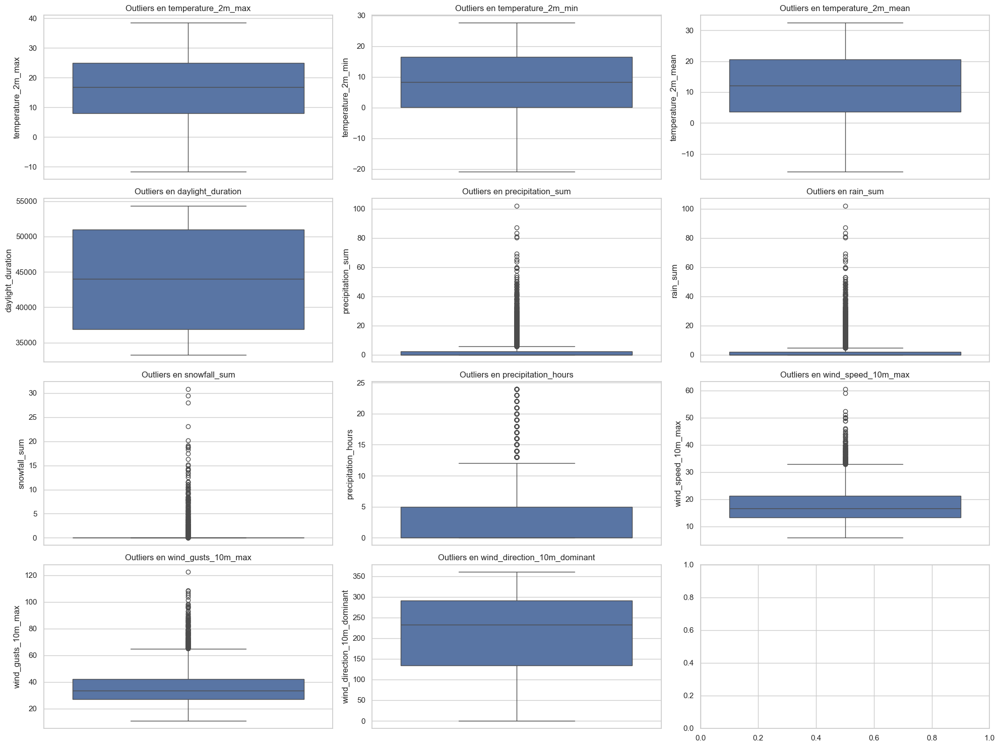

In [36]:
import seaborn as sns

# Configurar la apariencia de los gráficos de seaborn
sns.set(style='whitegrid')

# Crear boxplots para cada columna del DataFrame, excluyendo la primera columna
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 15))
for i, column in enumerate(df.columns[1:]):
    sns.boxplot(y=df[column], ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f'Outliers en {column}')

# Mostrar los gráficos
plt.tight_layout()
plt.show()

In [40]:

descripcion = df.describe()

# Mostrar el resumen estadístico
print(descripcion)

       temperature_2m_max  temperature_2m_min  temperature_2m_mean  \
count         7306.000000         7306.000000          7306.000000   
mean            16.280734            7.891520            11.685903   
std              9.987371            9.660332             9.754166   
min            -11.627500          -20.866500           -15.726918   
25%              8.033501            0.133500             3.607979   
50%             16.783499            8.233500            12.091834   
75%             25.033499           16.533499            20.538188   
max             38.483500           27.633500            32.448080   

       daylight_duration  precipitation_sum     rain_sum  snowfall_sum  \
count        7306.000000        7306.000000  7306.000000   7306.000000   
mean        43936.075569           3.125308     2.852532      0.195714   
std          7233.102915           7.354603     7.086041      1.341372   
min         33292.480000           0.000000     0.000000      0.000000   

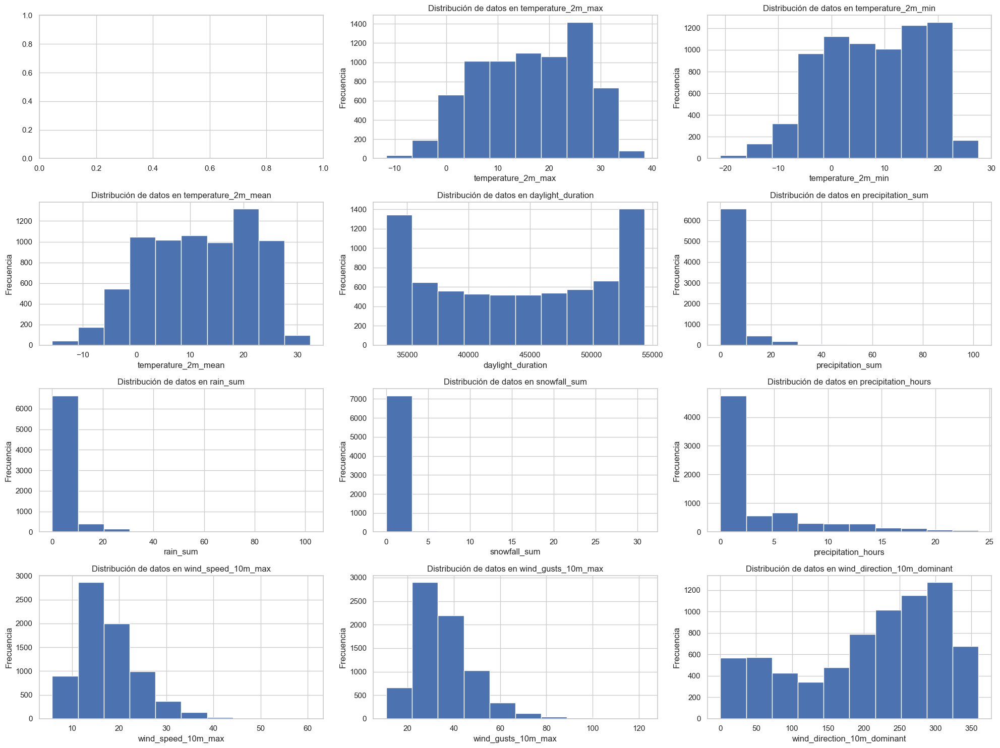

In [41]:

# Crear un histograma para cada columna numérica del dataset dt
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 15))
for i, column in enumerate(df.columns):
    if df[column].dtype in ['int64', 'float64']:
        df[column].hist(ax=axes[i//3, i%3])
        axes[i//3, i%3].set_title(f'Distribución de datos en {column}')
        axes[i//3, i%3].set_xlabel(column)
        axes[i//3, i%3].set_ylabel('Frecuencia')

# Mostrar los histogramas
plt.tight_layout()
plt.show()

transformacion del dataset


In [43]:
# Crear una lista con los nuevos nombres de las columnas
nuevos_nombres = ['dia', 'temperatura_max', 'temperatura_min','temperatura_promedio', 'tiempo_de_luz_solar', 'sumatoria_precipitaciones_totale', 'sumatoria_precipitaciones_luvias', 'sumatoria_precipitaciones_nevadas', 'horas_de_precipitaciones', 'velocidad_max_viento', 'velocidad_max_rafagas_viento', 'direccion_viento']

# Asignar los nuevos nombres a las columnas del DataFrame
df.columns = nuevos_nombres

# Verificar que los nombres de las columnas se han actualizado
df.head()  # Mostrar las primeras filas del DataFrame con los nuevos nombres de las columnas

,dia,temperatura_max,temperatura_min,temperatura_promedio,tiempo_de_luz_solar,sumatoria_precipitaciones_totale,sumatoria_precipitaciones_luvias,sumatoria_precipitaciones_nevadas,horas_de_precipitaciones,velocidad_max_viento,velocidad_max_rafagas_viento,direccion_viento
0,2000-01-01 00:00:00+00:00,9.4835,-3.0665,1.221000,33502.613,0.0,0.0,0.0,0.0,12.245293,23.039999,218.86272
1,2000-01-02 00:00:00+00:00,14.3335,0.5335,5.710583,33545.810,0.0,0.0,0.0,0.0,13.979871,28.800000,213.90630
2,2000-01-03 00:00:00+00:00,15.5835,10.2335,11.543918,33593.145,1.1,1.1,0.0,5.0,18.079027,33.480000,219.18378
3,2000-01-04 00:00:00+00:00,15.6835,10.1835,12.729332,33644.492,7.3,7.3,0.0,7.0,24.269983,71.640000,187.88863
4,2000-01-05 00:00:00+00:00,13.9335,0.0835,4.562666,33699.742,12.1,12.1,0.0,8.0,24.951921,56.880000,306.18768


In [52]:

import pandas as pd

# Suponiendo que 'dia' es el nombre de la columna que deseas convertir a tipo date
df['dia'] = df['dia'].astype('datetime64[ns]')


df.head(20)

,dia,temperatura_max,temperatura_min,temperatura_promedio,tiempo_de_luz_solar,sumatoria_precipitaciones_totale,sumatoria_precipitaciones_luvias,sumatoria_precipitaciones_nevadas,horas_de_precipitaciones,velocidad_max_viento,velocidad_max_rafagas_viento,direccion_viento
0,2000-01-01,9.4835,-3.066500,1.221000,33502.613,0.0,0.0,0.00,0.0,12.245293,23.039999,218.862720
1,2000-01-02,14.3335,0.533500,5.710583,33545.810,0.0,0.0,0.00,0.0,13.979871,28.800000,213.906300
2,2000-01-03,15.5835,10.233500,11.543918,33593.145,1.1,1.1,0.00,5.0,18.079027,33.480000,219.183780
3,2000-01-04,15.6835,10.183500,12.729332,33644.492,7.3,7.3,0.00,7.0,24.269983,71.640000,187.888630
4,2000-01-05,13.9335,0.083500,4.562666,33699.742,12.1,12.1,0.00,8.0,24.951921,56.880000,306.187680
5,2000-01-06,4.8835,-4.766500,-0.774833,33758.770,0.0,0.0,0.00,0.0,13.755580,26.640000,120.560745
6,2000-01-07,7.7835,-2.016500,1.702250,33821.453,0.0,0.0,0.00,0.0,21.791153,40.320000,242.008060
7,2000-01-08,3.3335,-4.166500,-0.149833,33887.668,0.0,0.0,0.00,0.0,13.708391,33.839996,266.537660
8,2000-01-09,9.4835,-0.466500,3.256417,33957.310,0.0,0.0,0.00,0.0,14.058450,24.840000,218.326900
9,2000-01-10,11.7335,3.083500,6.256417,34030.242,16.5,16.5,0.00,7.0,26.758923,62.279995,132.893510


guardo los datasets limpios


In [53]:
df.to_parquet('Historical_Weather_clean.parquet')

conclusiones 

1.  Tendencia de calentamiento: Durante las últimas dos décadas, ha habido una tendencia general hacia un aumento de las temperaturas en Nueva York. Esto se refleja en un aumento gradual tanto en las temperaturas máximas como en las mínimas, así como en la temperatura media.

2. Variabilidad estacional: Se observa una marcada variabilidad estacional en las temperaturas, con veranos generalmente más cálidos y inviernos más fríos. Esta variabilidad estacional es consistente con los patrones climáticos típicos de la región.

3. Impacto de la velocidad del viento: La velocidad del viento y las ráfagas tienen un efecto significativo en las condiciones climáticas de Nueva York. Los días con velocidades de viento más altas pueden sentirse más frescos, incluso si la temperatura real es alta, mientras que los días con vientos más suaves pueden percibirse como más cálidos.

4. Dirección del viento: La dirección del viento también desempeña un papel importante en el clima de la ciudad. Dependiendo de la dirección del viento, pueden experimentarse cambios en la temperatura y en la sensación térmica, así como en otros aspectos meteorológicos.

5. Impacto en la vida urbana: Estas tendencias y variabilidades en las condiciones climáticas tienen un impacto significativo en la vida urbana, desde la demanda de energía y servicios hasta la salud pública y el comportamiento humano en general. El análisis de estos datos puede proporcionar información valiosa para la planificación urbana y la adaptación al cambio climático en la ciudad de Nueva York.